In [11]:
import os, math, torch, torch.nn as nn, torch.nn.functional as F
import numpy as np, matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import MNIST
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [12]:
dimX, dimH, dimZ = 784, 500, 50
batch_size = 50
lr_vae = 1e-4
n_iter_vae = 200
labels = [[i] for i in range(10)]
N_task = len(labels)
n_layers_shared, n_layers_head, n_layers_enc = 2, 2, 3

In [13]:
class BinarizedMNIST(Dataset):
    def __init__(self, ds, digits):
        self.indices = [i for i, t in enumerate(ds.targets) if t in digits]
        self.ds = ds
    def __len__(self): return len(self.indices)
    def __getitem__(self, idx):
        x, y = self.ds[self.indices[idx]]
        return (x.view(-1) > 0.5).float(), y

def get_loaders(digits, batch_size):
    tfm = transforms.ToTensor()
    tr = MNIST('./data', train=True, download=True, transform=tfm)
    tr_loader = DataLoader(BinarizedMNIST(tr, digits), batch_size=batch_size, shuffle=True)
    return tr_loader, len(tr_loader.dataset)

In [14]:
class BayesianLinear(nn.Module):
    def __init__(self, in_dim, out_dim, init_log_var=-12.0):
        super().__init__()
        self.mu_W = nn.Parameter(torch.empty(out_dim, in_dim))
        self.log_var_W = nn.Parameter(torch.full((out_dim, in_dim), init_log_var))
        self.mu_b = nn.Parameter(torch.empty(out_dim))
        self.log_var_b = nn.Parameter(torch.full((out_dim,), init_log_var))
        nn.init.kaiming_uniform_(self.mu_W, a=math.sqrt(5))
        fan_in = nn.init._calculate_fan_in_and_fan_out(self.mu_W)[0]
        bound = 1 / math.sqrt(fan_in)
        nn.init.uniform_(self.mu_b, -bound, bound)
    def forward(self, x):
        if self.training:
            W = self.mu_W + (0.5 * self.log_var_W).exp() * torch.randn_like(self.log_var_W)
            b = self.mu_b + (0.5 * self.log_var_b).exp() * torch.randn_like(self.log_var_b)
        else:
            W, b = self.mu_W, self.mu_b
        return F.linear(x, W, b)

In [21]:
class Generator(nn.Module):
    def __init__(self, dimZ, dimH, dimX, nh, ns, nt):
        super().__init__()
        self.heads = nn.ModuleDict({
            str(t): nn.Sequential(*[
                layer for i in range(nh)
                for layer in [BayesianLinear(dimZ if i == 0 else dimH, dimH), nn.ReLU()]
            ]) for t in range(nt)
        })
        self.shared = nn.Sequential(*[
            layer for i in range(ns - 1)
            for layer in [BayesianLinear(dimH, dimH), nn.ReLU()]
        ] + [BayesianLinear(dimH, dimX)])
    def forward(self, z, tid): return self.shared(self.heads[str(tid)](z))

class Encoder(nn.Module):
    def __init__(self, dx, dh, dz, nl, nt):
        super().__init__()
        self.dimZ = dz
        self.encoders = nn.ModuleDict({
            str(t): nn.Sequential(*(
                [nn.Linear(dx, dh), nn.ReLU()] +
                sum([[nn.Linear(dh, dh), nn.ReLU()] for _ in range(nl - 2)], []) +
                [nn.Linear(dh, dz * 2)]
            )) for t in range(nt)
        })
    def forward(self, x, tid):
        out = self.encoders[str(tid)](x)
        return out[:, :self.dimZ], out[:, self.dimZ:]

In [16]:
def vae_loss(x, x_logits, mu, log_var):
    recon = F.binary_cross_entropy_with_logits(x_logits, x, reduction='sum') / x.size(0)
    kl = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp(), dim=1).mean()
    return recon + kl, recon, kl

def kl_gauss(mu_q, log_var_q, mu_p, log_var_p):
    return 0.5 * ((log_var_p - log_var_q) + (log_var_q.exp() + (mu_q - mu_p).pow(2)) / log_var_p.exp() - 1).sum()

def kl_theta(model, prior):
    total = 0.
    for name, p in model.shared.named_parameters():
        if 'mu' in name:
            q_mu = p
            q_logvar = dict(model.shared.named_parameters())[name.replace('mu', 'log_var')]
            p_mu = torch.tensor(prior[name], device=p.device)
            p_logvar = torch.tensor(prior[name.replace('mu', 'log_var')], device=p.device)
            total += kl_gauss(q_mu, q_logvar, p_mu, p_logvar)
    return total

def reset_logvar(model, value=-12.0):
    for name, p in model.shared.named_parameters():
        if 'log_var' in name: p.data.fill_(value)

def get_prior(model):
    return {name: p.data.cpu().numpy().copy() for name, p in model.shared.named_parameters()}

def update_prior(model, prior): prior.update(get_prior(model))

In [17]:
class MNISTClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(784, 1000), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(1000, 1000), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(1000, 1000), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(1000, 10)
        )
    def forward(self, x): return self.net(x)

def train_classifier():
    model = MNISTClassifier().to(device)
    opt = torch.optim.Adam(model.parameters(), lr=1e-3)
    loss_fn = nn.CrossEntropyLoss()
    tfm = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
    tr = MNIST('./data', train=True, download=True, transform=tfm)
    loader = DataLoader(tr, batch_size=100, shuffle=True)
    for _ in range(20):
        model.train()
        for x, y in loader:
            x, y = x.view(x.size(0), -1).to(device), y.to(device)
            opt.zero_grad()
            loss_fn(model(x), y).backward()
            opt.step()
    return model.eval()

In [19]:
@torch.no_grad()
def kl_eval(vae, clf, tid, digit, n=1000, b=100):
    kls = []
    y_true = F.one_hot(torch.tensor(digit), 10).float().to(device)
    for _ in range(n // b):
        z = torch.randn(b, dimZ).to(device)
        x = torch.sigmoid(vae(z, tid))
        x = (x - 0.1307) / 0.3081
        logits = clf(x)
        logp = F.log_softmax(logits, 1)
        kl = -(y_true * logp).sum(1)
        kls.append(kl.cpu())
    kls = torch.cat(kls)
    return kls.mean().item()

def show_images(images, title=""):
    images = images.detach().cpu().view(-1, 1, 28, 28)
    grid = make_grid(images, nrow=10)
    plt.figure(figsize=(10, 4))
    plt.title(title)
    plt.axis("off")
    plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap="gray")
    plt.show()

In [9]:
clf = train_classifier()

100%|██████████| 9.91M/9.91M [00:00<00:00, 16.5MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 494kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.93MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.78MB/s]


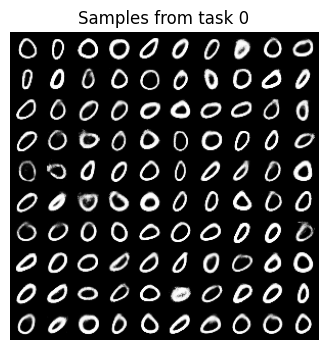

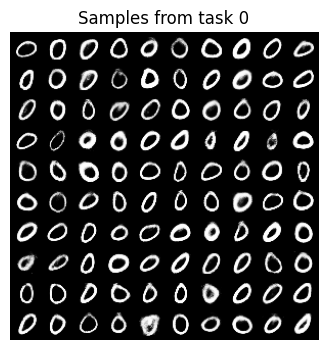

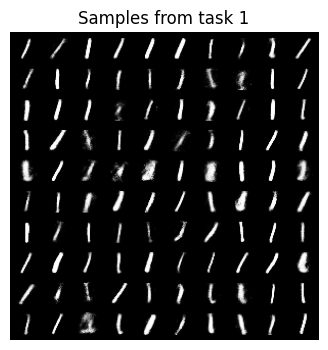

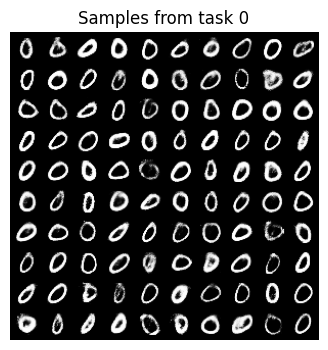

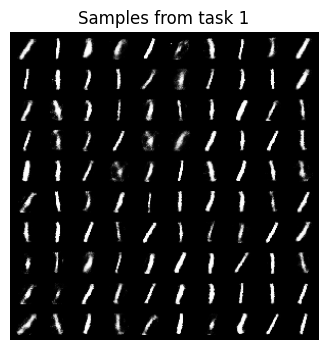

...

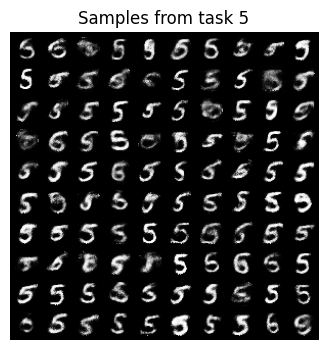

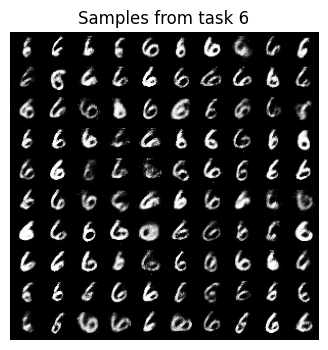

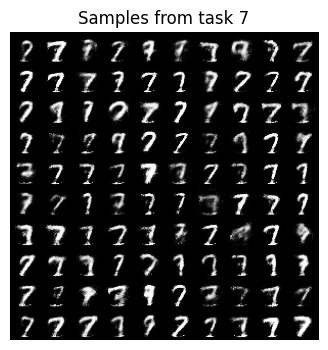

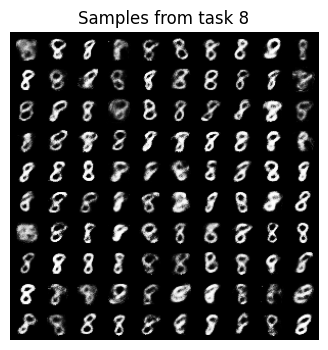

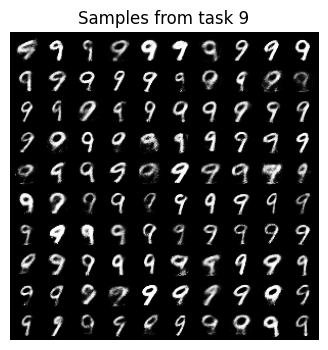

In [22]:
vae = Generator(dimZ, dimH, dimX, n_layers_head, n_layers_shared, N_task).to(device)
enc = Encoder(dimX, dimH, dimZ, n_layers_enc, N_task).to(device)
opt = torch.optim.Adam(list(vae.parameters()) + list(enc.parameters()), lr=lr_vae)
prior = {}
kl_table = {}

for task in range(N_task):
    tr_loader, n_data = get_loaders(labels[task], batch_size)
    if task > 0: reset_logvar(vae)
    vae.train(); enc.train()
    for _ in tqdm(range(n_iter_vae), desc=f"task {task}", leave=False):
        for x, _ in tr_loader:
            x = x.to(device)
            opt.zero_grad()
            mu, log_var = enc(x, task)
            z = mu + (0.5 * log_var).exp() * torch.randn_like(mu)
            x_logits = vae(z, task)
            loss, _, _ = vae_loss(x, x_logits, mu, log_var)
            kl = kl_theta(vae, prior) / n_data if task > 0 else 0.
            (loss + kl).backward()
            opt.step()
    vae.eval()
    res = []
    for t in range(task + 1):
        z = torch.randn(100, dimZ).to(device)
        samples = torch.sigmoid(vae(z, t))
        show_images(samples, f"Samples from task {t}")
        d = labels[t][0]
        k = kl_eval(vae, clf, t, d)
        res.append((t, d, k))
    kl_table[task] = res
    update_prior(vae, prior)


In [23]:
for task_id in kl_table:
    print("task", task_id, "KLs:")
    for t, d, k in kl_table[task_id]:
        print(t, d, k)

task 0 KLs:
0 0 0.03696940466761589
task 1 KLs:
0 0 0.08136486262083054
1 1 0.21490216255187988
task 2 KLs:
0 0 0.09885882586240768
1 1 0.1851937621831894
2 2 0.2090488225221634
task 3 KLs:
0 0 0.14268571138381958
1 1 0.29027098417282104
2 2 0.3200577199459076
3 3 0.215105339884758
task 4 KLs:
0 0 0.21370720863342285
1 1 0.34156903624534607
2 2 0.41369107365608215
3 3 0.3212360441684723
4 4 0.1215117871761322
task 5 KLs:
0 0 0.2202235758304596
1 1 0.31590959429740906
2 2 0.5501862168312073
3 3 0.3579477369785309
4 4 0.16499589383602142
5 5 0.3879600465297699
task 6 KLs:
0 0 0.2708786725997925
1 1 0.34951460361480713
2 2 0.54262775182724
3 3 0.39084821939468384
4 4 0.09782683849334717
5 5 0.4425506591796875
6 6 0.07938408851623535
task 7 KLs:
0 0 0.23251865804195404
1 1 0.2649785876274109
2 2 0.5586376190185547
3 3 0.443051278591156
4 4 0.36862099170684814
5 5 0.4969000816345215
6 6 0.17593923211097717
7 7 0.23537041246891022
task 8 KLs:
0 0 0.23124636709690094
1 1 0.29642799496650696
2

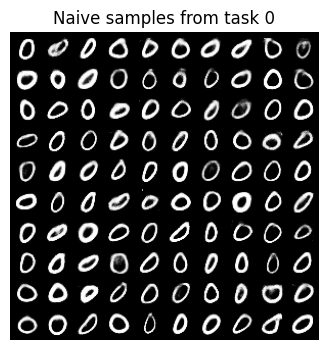

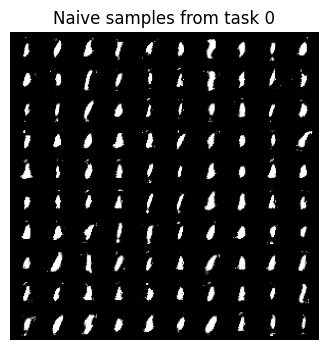

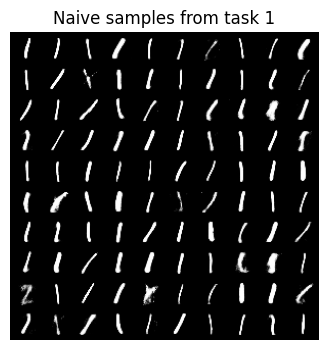

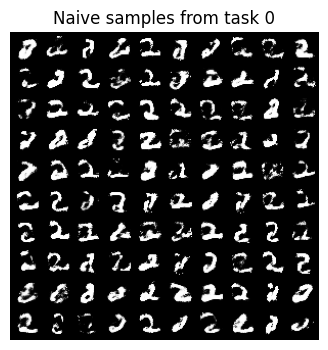

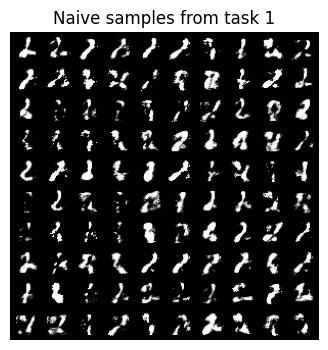

...

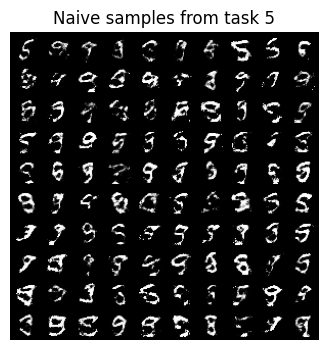

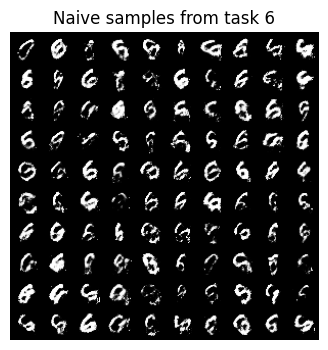

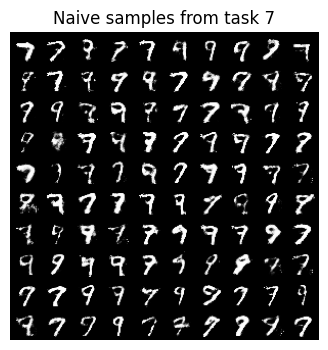

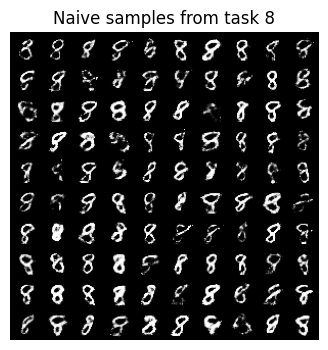

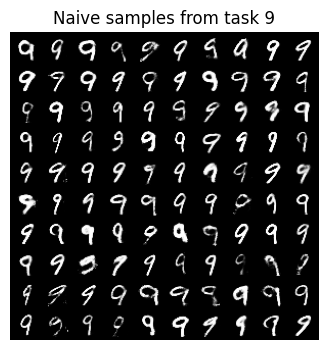

In [25]:
vae_naive = Generator(dimZ, dimH, dimX, n_layers_head, n_layers_shared, N_task).to(device)
enc_naive = Encoder(dimX, dimH, dimZ, n_layers_enc, N_task).to(device)
opt_naive = torch.optim.Adam(list(vae_naive.parameters()) + list(enc_naive.parameters()), lr=lr_vae)
kl_table_naive = {}

for task in range(N_task):
    tr_loader, n_data = get_loaders(labels[task], batch_size)
    vae_naive.train(); enc_naive.train()
    for _ in tqdm(range(n_iter_vae), desc=f"naive task {task}", leave=False):
        for x, _ in tr_loader:
            x = x.to(device)
            opt_naive.zero_grad()
            mu, log_var = enc_naive(x, task)
            z = mu + (0.5 * log_var).exp() * torch.randn_like(mu)
            x_logits = vae_naive(z, task)
            loss, _, _ = vae_loss(x, x_logits, mu, log_var)
            loss.backward()
            opt_naive.step()
    vae_naive.eval()
    res = []
    for t in range(task + 1):
        z = torch.randn(100, dimZ).to(device)
        samples = torch.sigmoid(vae_naive(z, t))
        show_images(samples, f"Naive samples from task {t}")
        d = labels[t][0]
        k = kl_eval(vae_naive, clf, t, d)
        res.append((t, d, k))
    kl_table_naive[task] = res

In [26]:
for task_id in kl_table_naive:
    print("naive task", task_id, "KLs:")
    for t, d, k in kl_table_naive[task_id]:
        print(t, d, k)

naive task 0 KLs:
0 0 0.06524376571178436
naive task 1 KLs:
0 0 13.544156074523926
1 1 0.12913085520267487
naive task 2 KLs:
0 0 23.465473175048828
1 1 5.675347805023193
2 2 0.1323176771402359
naive task 3 KLs:
0 0 30.973987579345703
1 1 6.504372596740723
2 2 8.274023056030273
3 3 0.2131986767053604
naive task 4 KLs:
0 0 16.025352478027344
1 1 7.248814105987549
2 2 9.56490707397461
3 3 7.842918872833252
4 4 0.14711827039718628
naive task 5 KLs:
0 0 15.043099403381348
1 1 6.837820529937744
2 2 9.391192436218262
3 3 11.679577827453613
4 4 4.151735305786133
5 5 0.19698645174503326
naive task 6 KLs:
0 0 15.13785171508789
1 1 7.9296064376831055
2 2 9.06588363647461
3 3 9.30903434753418
4 4 9.066863059997559
5 5 3.564649820327759
6 6 0.08067695796489716
naive task 7 KLs:
0 0 11.735208511352539
1 1 10.111242294311523
2 2 5.1405558586120605
3 3 3.9762063026428223
4 4 5.421182155609131
5 5 4.481938362121582
6 6 4.218094348907471
7 7 0.2294161319732666
naive task 8 KLs:
0 0 13.627236366271973
1 